In [1]:
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
from torch.utils.data import DataLoader, Dataset
from torch import nn, optim
import numpy as np
import random
from PIL import Image
import os
import matplotlib.pyplot as plt
import pandas as pd
import re

c:\Users\Aibar\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\utils\generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [2]:
data_path = 'metric_data/'
ebay_info = pd.read_csv(os.path.join(data_path, 'Ebay_info.txt'), sep=' ', header=0)
ebay_train = pd.read_csv(os.path.join(data_path, 'Ebay_train.txt'), sep=' ', header=0)
ebay_test = pd.read_csv(os.path.join(data_path, 'Ebay_test.txt'), sep=' ', header=0)

In [3]:
ebay_train['path']

0        bicycle_final/111085122871_0.JPG
1        bicycle_final/111085122871_1.JPG
2        bicycle_final/111085122871_2.JPG
3        bicycle_final/111085122871_3.JPG
4        bicycle_final/111085122871_4.JPG
                       ...               
59546    toaster_final/221852410489_0.JPG
59547    toaster_final/221852410489_1.JPG
59548    toaster_final/221852410489_2.JPG
59549    toaster_final/221852410489_3.JPG
59550    toaster_final/221852410489_4.JPG
Name: path, Length: 59551, dtype: object

In [ ]:
!pip install online_triplet_loss


In [8]:
all_data = pd.concat([ebay_info, ebay_train, ebay_test])

In [ ]:
def find_missing_images(data, base_path):
    missing_images = []
    for _, row in data.iterrows():
        img_path = os.path.join(base_path, row['path'])
        if not os.path.exists(img_path):
            missing_images.append(img_path)
    return missing_images

In [ ]:
missing_images = find_missing_images(all_data, data_path)

In [9]:
if missing_images:
    print("Missing images found:")
    for img in missing_images:
        print(img)
else:
    print("No missing images found.")

No missing images found.


In [9]:
def load_and_display_images(data, superclass_id, num_images=5):
    class_name = superclass_mapping[superclass_id]
    class_data = data[data['path'].str.contains(class_name)].sample(num_images)
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    for ax, (_, row) in zip(axes, class_data.iterrows()):
        img_path = os.path.join(data_path, row['path'])
        print(f"Loading image: {img_path}")
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(f"Class ID: {row['class_id']} ({class_name})")
            ax.axis('off')
        else:
            print(f"Image not found: {img_path}")
            ax.set_title("Image not found")
            ax.axis('off')
    plt.show()

In [10]:
classes = ['bicycle_final', 'cabinet_final', 'chair_final', 'coffee_maker_final', 'fan_final',
           'kettle_final', 'lamp_final', 'mug_final', 'sofa_final', 'stapler_final',
           'table_final', 'toaster_final']

In [11]:
superclass_mapping = {
    1: 'bicycle_final',
    2: 'cabinet_final',
    3: 'chair_final',
    4: 'coffee_maker_final',
    5: 'fan_final',
    6: 'kettle_final',
    7: 'lamp_final',
    8: 'mug_final',
    9: 'sofa_final',
    10: 'stapler_final',
    11: 'table_final',
    12: 'toaster_final'
}

In [12]:
superclass_ids = list(superclass_mapping.keys())

Loading image: metric_data/bicycle_final/311414925530_3.JPG
Loading image: metric_data/bicycle_final/131569220330_8.JPG
Loading image: metric_data/bicycle_final/171696021657_3.JPG
Loading image: metric_data/bicycle_final/111729178628_5.JPG
Loading image: metric_data/bicycle_final/281278334075_9.JPG


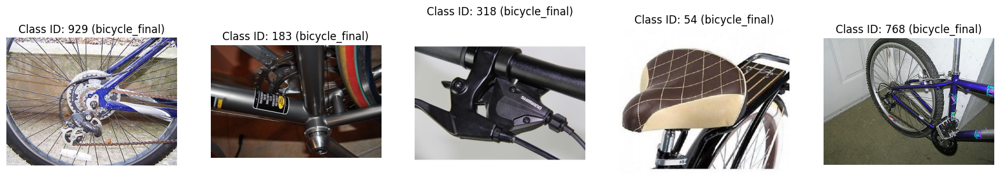

Loading image: metric_data/cabinet_final/181813484614_3.JPG
Loading image: metric_data/cabinet_final/181399695663_9.JPG
Loading image: metric_data/cabinet_final/181750029828_3.JPG
Loading image: metric_data/cabinet_final/111701328147_1.JPG
Loading image: metric_data/cabinet_final/131557338986_2.JPG


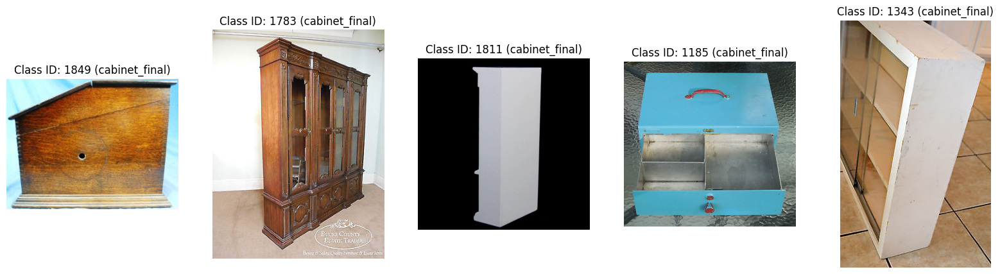

Loading image: metric_data/chair_final/221604081767_9.JPG
Loading image: metric_data/chair_final/161494492845_0.JPG
Loading image: metric_data/chair_final/141476868469_6.JPG
Loading image: metric_data/chair_final/200925386131_4.JPG
Loading image: metric_data/chair_final/150810016891_0.JPG


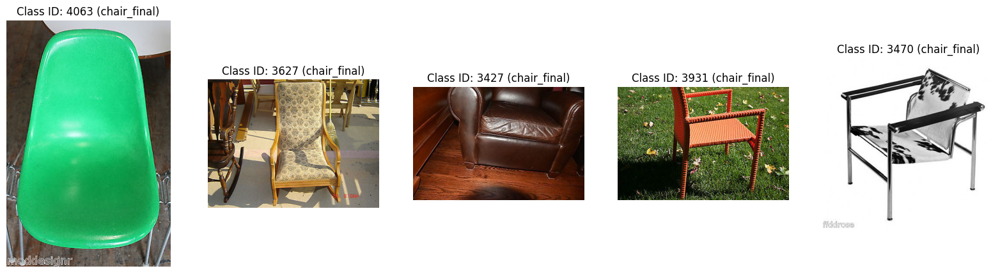

Loading image: metric_data/coffee_maker_final/201393279450_6.JPG
Loading image: metric_data/coffee_maker_final/301713208132_5.JPG
Loading image: metric_data/coffee_maker_final/131581376192_2.JPG
Loading image: metric_data/coffee_maker_final/221856609981_3.JPG
Loading image: metric_data/coffee_maker_final/231656378578_3.JPG


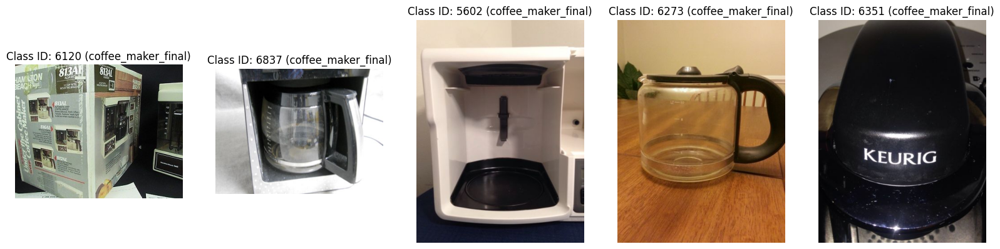

Loading image: metric_data/fan_final/291503207828_1.JPG
Loading image: metric_data/fan_final/191563998349_5.JPG
Loading image: metric_data/fan_final/221829830749_1.JPG
Loading image: metric_data/fan_final/400979864751_1.JPG
Loading image: metric_data/fan_final/191661740549_2.JPG


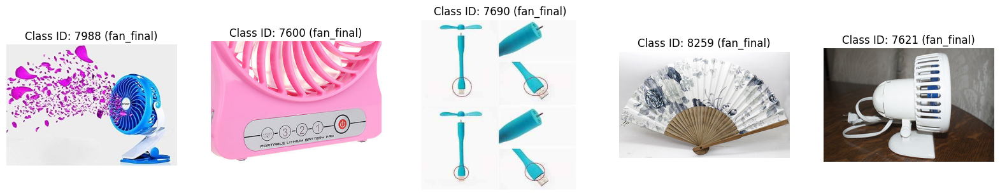

Loading image: metric_data/kettle_final/321837092319_5.JPG
Loading image: metric_data/kettle_final/221845885168_2.JPG
Loading image: metric_data/kettle_final/252060398750_8.JPG
Loading image: metric_data/kettle_final/171892577432_0.JPG
Loading image: metric_data/kettle_final/141745039491_5.JPG


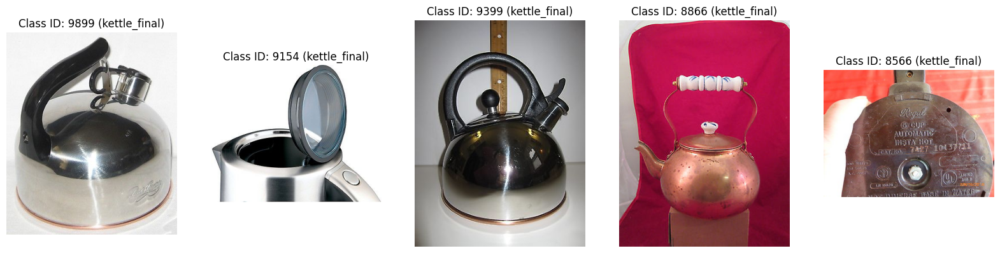

Loading image: metric_data/lamp_final/301684513155_7.JPG
Loading image: metric_data/lamp_final/191534747858_4.JPG
Loading image: metric_data/lamp_final/391123975895_4.JPG
Loading image: metric_data/lamp_final/291490541453_6.JPG
Loading image: metric_data/lamp_final/141738744178_7.JPG


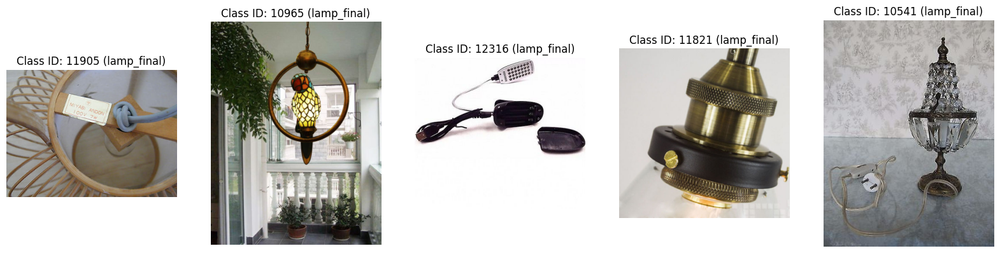

Loading image: metric_data/mug_final/161449862379_2.JPG
Loading image: metric_data/mug_final/161785831411_0.JPG
Loading image: metric_data/mug_final/161762961880_3.JPG
Loading image: metric_data/mug_final/181799836058_2.JPG
Loading image: metric_data/mug_final/331623897575_1.JPG


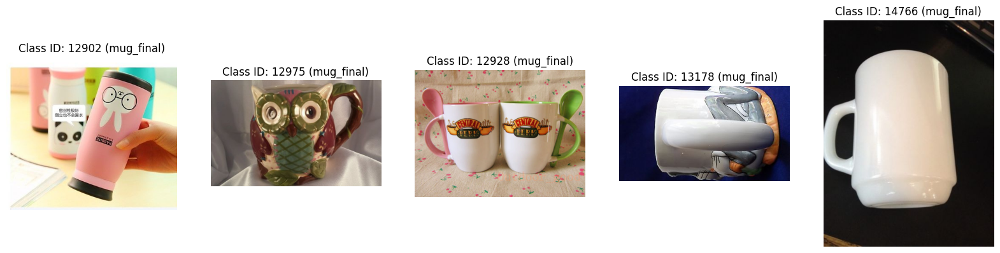

Loading image: metric_data/sofa_final/171857813503_4.JPG
Loading image: metric_data/sofa_final/251895129964_7.JPG
Loading image: metric_data/sofa_final/271933725478_2.JPG
Loading image: metric_data/sofa_final/251576578929_1.JPG
Loading image: metric_data/sofa_final/181822867419_1.JPG


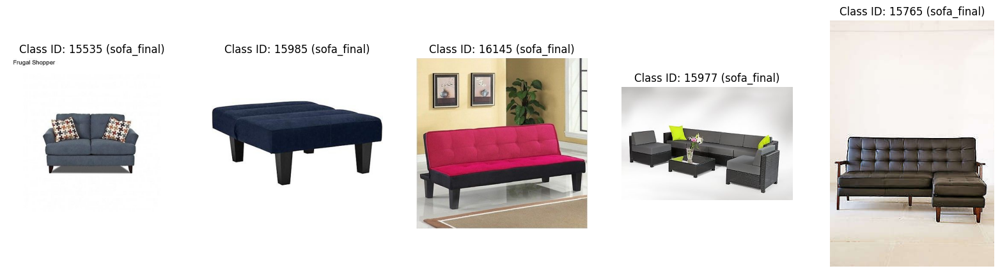

Loading image: metric_data/stapler_final/131565025410_1.JPG
Loading image: metric_data/stapler_final/252041376390_3.JPG
Loading image: metric_data/stapler_final/191635328332_2.JPG
Loading image: metric_data/stapler_final/191653170535_7.JPG
Loading image: metric_data/stapler_final/271947894601_1.JPG


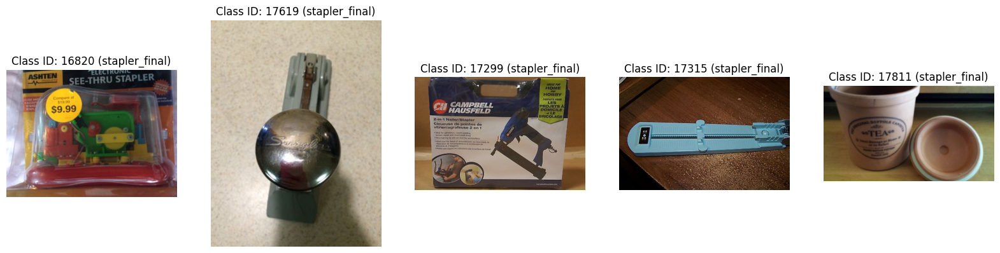

Loading image: metric_data/table_final/351245956329_4.JPG
Loading image: metric_data/table_final/141473868550_3.JPG
Loading image: metric_data/table_final/281520480639_7.JPG
Loading image: metric_data/table_final/251732425521_6.JPG
Loading image: metric_data/table_final/271687775099_4.JPG


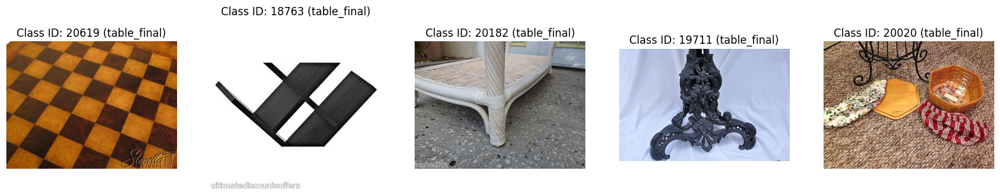

Loading image: metric_data/toaster_final/181834204769_5.JPG
Loading image: metric_data/toaster_final/381357870101_2.JPG
Loading image: metric_data/toaster_final/111732453607_2.JPG
Loading image: metric_data/toaster_final/361361871987_0.JPG
Loading image: metric_data/toaster_final/281719000075_0.JPG


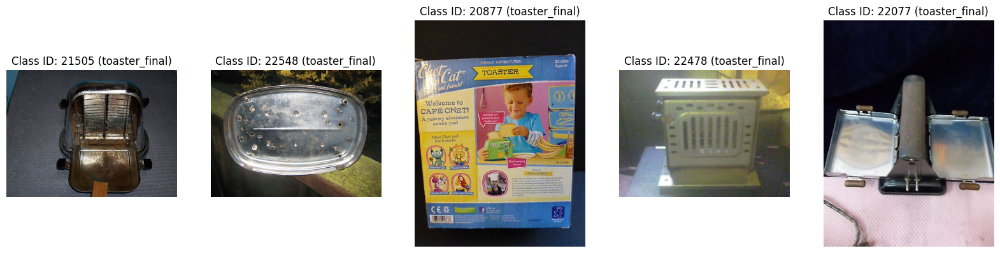

In [13]:
for superclass_id in superclass_ids:
    load_and_display_images(ebay_info, superclass_id)

In [ ]:
def get_image_sizes(data):
    image_sizes = set()
    for img_path in data['path']:
        full_path = os.path.join(data_path, img_path)
        if os.path.exists(full_path):
            img = cv2.imread(full_path)
            if img is not None:
                image_sizes.add(img.shape[:2])
            else:
                print(f"Error reading image: {full_path}")
        else:
            print(f"Image not found: {full_path}")
    return image_sizes

In [ ]:
combined_data = pd.concat([ebay_info, ebay_train, ebay_test])

In [ ]:
image_sizes = get_image_sizes(combined_data)

In [ ]:
print("Set of image sizes in the dataset:")
print(image_sizes)

Set of image sizes in the dataset:
{(400, 348), (500, 435), (2400, 3201), (1200, 1600), (312, 500), (500, 471), (446, 500), (243, 400), (400, 204), (400, 240), (500, 327), (263, 500), (400, 325), (476, 500), (400, 361), (500, 448), (1073, 984), (398, 400), (136, 400), (600, 800), (400, 217), (1200, 1024), (500, 304), (418, 500), (349, 400), (500, 160), (166, 400), (400, 338), (888, 650), (285, 500), (500, 425), (250, 250), (379, 400), (364, 500), (400, 194), (500, 281), (498, 500), (117, 400), (379, 665), (1543, 2343), (508, 550), (600, 404), (284, 284), (196, 400), (330, 400), (315, 500), (400, 315), (500, 402), (1500, 2237), (266, 500), (500, 438), (197, 400), (400, 171), (350, 350), (80, 80), (345, 500), (167, 234), (400, 207), (479, 500), (500, 294), (1185, 1300), (296, 500), (227, 400), (400, 328), (500, 415), (2400, 3001), (247, 500), (400, 184), (500, 271), (169, 400), (326, 500), (460, 500), (262, 335), (382, 400), (400, 305), (500, 392), (1200, 1148), (199, 400), (400, 161), (

In [5]:
filename_to_images = {}
superclass_to_images = {}
for _, row in ebay_info.iterrows():
    product_name = row['path'].split('/')[-1].split('_')[0]
    superclass_id = str(row['super_class_id'])
    filename = os.path.basename(row['path'])
    if product_name not in filename_to_images:
        filename_to_images[product_name] = []
    filename_to_images[product_name].append(os.path.join(data_path, row['path']))
    
    if superclass_id not in superclass_to_images:
        superclass_to_images[superclass_id] = []
    superclass_to_images[superclass_id].append(os.path.join(data_path, row['path']))

In [ ]:
filename_to_images

In [ ]:
superclass_to_images

In [6]:
class StanfordOnlineProductsDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images_per_class=8000):
        self.root_dir = root_dir
        self.transform = transform
        self.data = []
        self.class_to_images = {}

        with open(os.path.join(root_dir, 'Ebay_train.txt'), 'r') as f:
            lines = f.readlines()[1:]
            for line in lines:
                parts = line.strip().split()
                image_id, class_id, super_class_id, path = parts
                if super_class_id not in self.class_to_images:
                    self.class_to_images[super_class_id] = []
                self.class_to_images[super_class_id].append((os.path.join(root_dir, path), int(class_id)))

        for class_id, images in self.class_to_images.items():
            self.data.extend(images[:max_images_per_class])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label, img_path

In [7]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [8]:
dataset = StanfordOnlineProductsDataset(root_dir='metric_data', transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

In [9]:
model = resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 128)
model = model.cuda()
criterion = nn.TripletMarginLoss(margin=1.0, p=2)
optimizer = optim.Adam(model.parameters(), lr=0.001)

c:\Users\Aibar\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Aibar\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [10]:
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

In [11]:
def get_triplet_batch(batch):
    images, labels, paths = batch
    anchors = []
    positives = []
    negatives = []
    anchor_paths = []
    positive_paths = []
    negative_paths = []
    anchor_superclasses = []
    positive_superclasses = []
    negative_superclasses = []

    batch_size = len(labels)
    for i in range(batch_size):
        anchor = images[i]
        anchor_path = paths[i]
        anchor_filename = os.path.basename(anchor_path)
        product_name = anchor_filename.split('_')[0]

        rel_anchor_path = os.path.relpath(anchor_path, data_path).replace('\\', '/')
        superclass_id = ebay_info[ebay_info['path'] == rel_anchor_path]['super_class_id'].values
        if len(superclass_id) == 0:
            print(f"Superclass ID not found for {anchor_path}. Skipping this triplet.")
            continue
        superclass_id = str(superclass_id[0])

        positive_paths_list = filename_to_images[product_name]
        positive_path = random.choice([p for p in positive_paths_list if p != anchor_path])
        positive_image = Image.open(positive_path).convert('RGB')
        positive_image = transform(positive_image)

        if superclass_id in superclass_to_images:
            negative_paths_list = superclass_to_images[superclass_id]
            negative_path = random.choice([p for p in negative_paths_list if p.split('/')[-1].split('_')[0] != product_name])
            negative_image = Image.open(negative_path).convert('RGB')
            negative_image = transform(negative_image)
        else:
            print(f"Superclass {superclass_id} not found in superclass_to_images. Skipping this triplet.")
            continue

        anchors.append(anchor)
        positives.append(positive_image)
        negatives.append(negative_image)
        anchor_paths.append(anchor_path)
        positive_paths.append(positive_path)
        negative_paths.append(negative_path)
        anchor_superclasses.append(superclass_id)
        positive_superclasses.append(superclass_id)
        negative_superclasses.append(superclass_id)

    if len(anchors) == 0:
        raise ValueError("No valid triplets found in the batch.")

    return torch.stack(anchors), torch.stack(positives), torch.stack(negatives), anchor_paths, positive_paths, negative_paths, anchor_superclasses, positive_superclasses, negative_superclasses


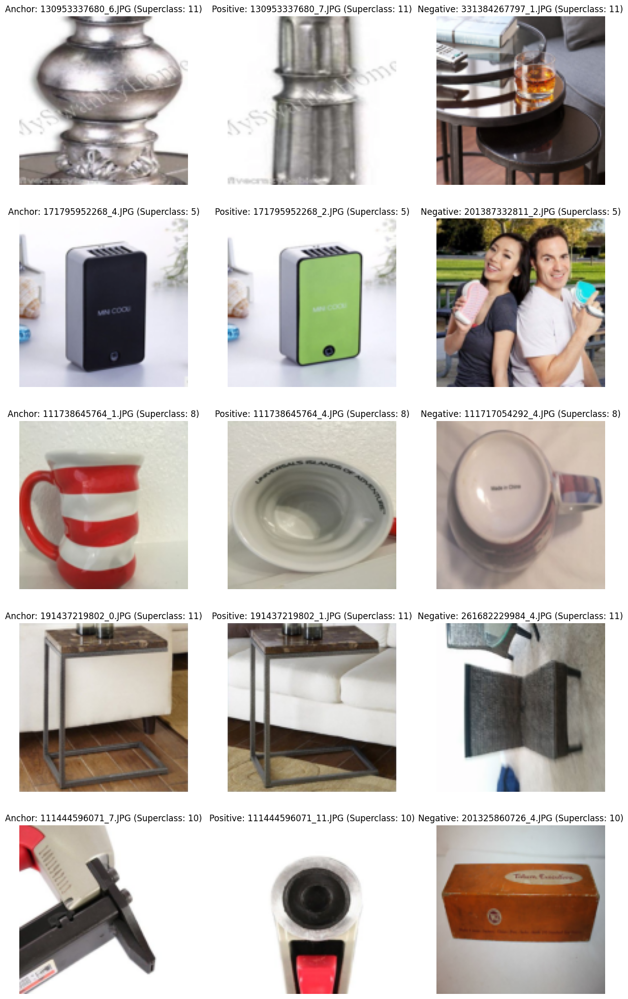

In [22]:
def print_triplet_examples(dataloader, num_examples=5):
    for i, batch in enumerate(dataloader):
        anchors, positives, negatives, anchor_paths, positive_paths, negative_paths, anchor_superclasses, positive_superclasses, negative_superclasses = get_triplet_batch(batch)
        if i == 0:
            fig, axs = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))
            for j in range(num_examples):
                if j >= len(anchors):
                    break

                anchor_img = denormalize(anchors[j].cpu()).permute(1, 2, 0).numpy()
                positive_img = denormalize(positives[j].cpu()).permute(1, 2, 0).numpy()
                negative_img = denormalize(negatives[j].cpu()).permute(1, 2, 0).numpy()

                axs[j, 0].imshow(anchor_img)
                axs[j, 0].set_title(f'Anchor: {os.path.basename(anchor_paths[j])} (Superclass: {anchor_superclasses[j]})')
                axs[j, 0].axis('off')

                axs[j, 1].imshow(positive_img)
                axs[j, 1].set_title(f'Positive: {os.path.basename(positive_paths[j])} (Superclass: {positive_superclasses[j]})')
                axs[j, 1].axis('off')

                axs[j, 2].imshow(negative_img)
                axs[j, 2].set_title(f'Negative: {os.path.basename(negative_paths[j])} (Superclass: {negative_superclasses[j]})')
                axs[j, 2].axis('off')

            plt.show()
        break

print_triplet_examples(dataloader)

In [123]:
def train_model(model, dataloader, criterion, optimizer, num_epochs=5, save_path='metric_data'):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for i, batch in enumerate(dataloader):
            anchors, positives, negatives, _, _, _, _, _, _ = get_triplet_batch(batch)
            if len(anchors) == 0:
                print("No valid triplets found in this batch. Skipping...")
                continue

            anchors, positives, negatives = anchors.cuda(), positives.cuda(), negatives.cuda()

            optimizer.zero_grad()
            anchor_output = model(anchors)
            positive_output = model(positives)
            negative_output = model(negatives)

            loss = criterion(anchor_output, positive_output, negative_output)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            if i % 10 == 9:
                print(f'Epoch [{epoch + 1}/{num_epochs}], Step [{i + 1}/{len(dataloader)}], Loss: {running_loss / 10:.4f}')
                running_loss = 0.0

        torch.save(model.state_dict(), os.path.join(save_path, f'resnet50_triplet_epoch_{epoch+1}.pth'))
        print(f'Model saved after epoch {epoch+1}')

In [ ]:
train_model(model, dataloader, criterion, optimizer)

In [55]:
model_path = 'metric_data/resnet50_triplet_epoch_5_V2.pth'
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [56]:
from torch.utils.data import DataLoader, Dataset, Subset

In [86]:
class StanfordOnlineProductsDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images_per_class=100):
        self.root_dir = root_dir
        self.transform = transform
        self.data = []
        self.class_to_images = {}

        with open(os.path.join(root_dir, 'Ebay_train.txt'), 'r') as f:
            lines = f.readlines()[1:]
            for line in lines:
                parts = line.strip().split()
                image_id, class_id, super_class_id, path = parts
                if super_class_id not in self.class_to_images:
                    self.class_to_images[super_class_id] = []
                self.class_to_images[super_class_id].append((os.path.join(root_dir, path), int(class_id)))

        for class_id, images in self.class_to_images.items():
            self.data.extend(images[:max_images_per_class])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label, img_path

In [87]:
test_dataset = StanfordOnlineProductsDataset(root_dir='metric_data', transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [88]:
def extract_features(model, dataloader):
    model.eval()
    features = []
    labels = []
    paths = []
    with torch.no_grad():
        for images, lbls, img_paths in dataloader:
            images = images.cuda()
            outputs = model(images)
            features.append(outputs.cpu().numpy())
            labels.append(lbls.numpy())
            paths.extend(img_paths)
    return np.concatenate(features), np.concatenate(labels), paths

features, labels, paths = extract_features(model, test_dataloader)

In [89]:
def find_similar_images(query_features, features, k=5):
    distances = np.linalg.norm(features - query_features, axis=1)
    indices = np.argsort(distances)[:k]
    return indices

In [60]:
def compute_top_k_accuracy(model, test_dataset, features, labels, k=5):
    correct = 0
    total = 0
    for i in range(len(test_dataset)):
        query_img, query_label, _ = test_dataset[i]
        query_img = query_img.unsqueeze(0).cuda()
        with torch.no_grad():
            query_features = model(query_img).cpu().numpy()
        indices = find_similar_images(query_features, features, k=k)
        top_k_labels = labels[indices]
        if query_label in top_k_labels:
            correct += 1
        total += 1
    return correct / total


In [61]:
top_5_accuracy = compute_top_k_accuracy(model, test_dataset, features, labels, k=5)
print(f'Top-5 Accuracy: {top_5_accuracy * 100:.2f}%')

Top-5 Accuracy: 100.00%


In [38]:
def visualize_query_and_results(query_img, indices, dataset):
    plt.figure(figsize=(20, 10))

    def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        return tensor

    plt.subplot(1, len(indices) + 1, 1)
    query_img = unnormalize(query_img).permute(1, 2, 0).numpy()
    query_img = np.clip(query_img, 0, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    plt.axis('off')

    for i, idx in enumerate(indices):
        img, _, _ = dataset[idx]
        img = unnormalize(img).permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        plt.subplot(1, len(indices) + 1, i + 2)
        plt.imshow(img)
        plt.title(f'Similar Image {i + 1}')
        plt.axis('off')

    plt.show()

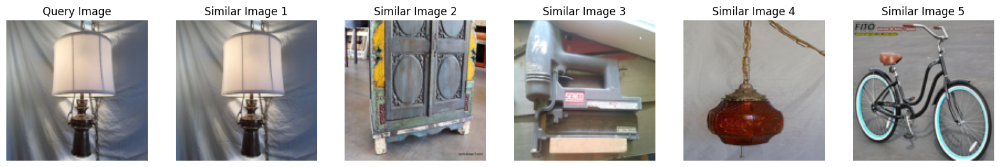

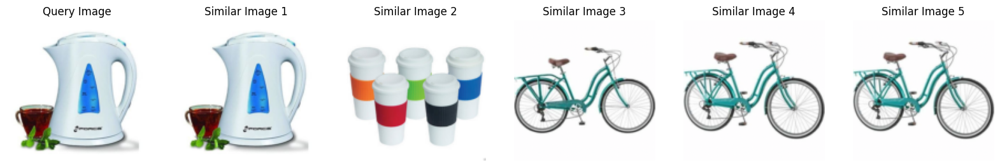

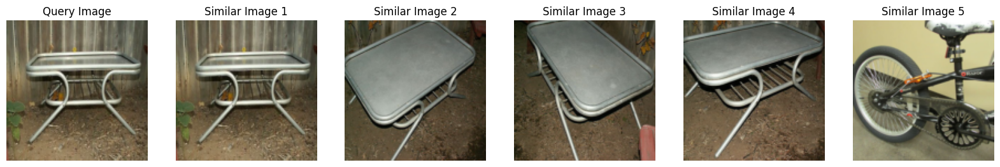

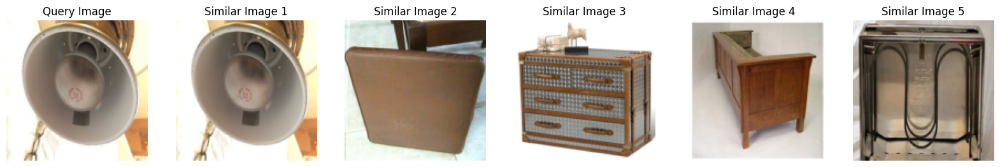

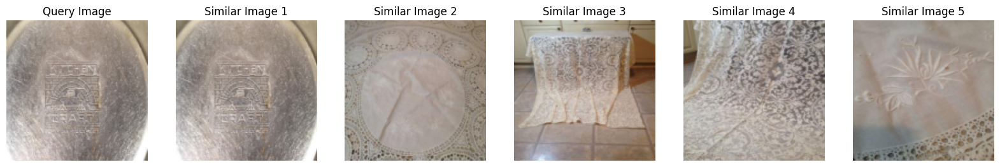

In [39]:
for _ in range(5):
    random_idx = random.randint(0, len(dataset) - 1)
    query_img, _, _ = dataset[random_idx]
    query_image = query_img.unsqueeze(0).cuda()
    with torch.no_grad():
        query_features = model(query_image).cpu().numpy()
    indices = find_similar_images(query_features, features, k=5)
    visualize_query_and_results(query_img, indices, dataset)

In [133]:
model = resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 128)
model_path = 'metric_data/resnet50_triplet_epoch_5.pth'
model.load_state_dict(torch.load(model_path))
model = model.cuda()
criterion = nn.TripletMarginLoss(margin=1.0, p=2)
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [82]:
class StanfordOnlineProductsDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images_per_class=3000):
        self.root_dir = root_dir
        self.transform = transform
        self.data = []
        self.class_to_images = {}

        with open(os.path.join(root_dir, 'Ebay_train.txt'), 'r') as f:
            lines = f.readlines()[1:]
            for line in lines:
                parts = line.strip().split()
                image_id, class_id, super_class_id, path = parts
                if super_class_id not in self.class_to_images:
                    self.class_to_images[super_class_id] = []
                self.class_to_images[super_class_id].append((os.path.join(root_dir, path), int(class_id)))

        for class_id, images in self.class_to_images.items():
            self.data.extend(images[:max_images_per_class])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label, img_path

In [83]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [84]:
dataset = StanfordOnlineProductsDataset(root_dir='metric_data', transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

In [137]:
def train_model(model, dataloader, criterion, optimizer, num_epochs=5, save_path='metric_data'):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for i, batch in enumerate(dataloader):
            anchors, positives, negatives, _, _, _, _, _, _ = get_triplet_batch(batch)
            if len(anchors) == 0:
                print("No valid triplets found in this batch. Skipping...")
                continue

            anchors, positives, negatives = anchors.cuda(), positives.cuda(), negatives.cuda()

            optimizer.zero_grad()
            anchor_output = model(anchors)
            positive_output = model(positives)
            negative_output = model(negatives)

            loss = criterion(anchor_output, positive_output, negative_output)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            if i % 10 == 9:
                print(f'Epoch [{epoch + 1}/{num_epochs}], Step [{i + 1}/{len(dataloader)}], Loss: {running_loss / 10:.4f}')
                running_loss = 0.0

        torch.save(model.state_dict(), os.path.join(save_path, f'resnet50_triplet_epoch_{epoch+1}_V2.pth'))
        print(f'Model saved after epoch {epoch+1}')

In [ ]:
train_model(model, dataloader, criterion, optimizer)

In [90]:
def visualize_query_and_results(query_img, query_path, indices, test_dataset, paths):
    plt.figure(figsize=(22, 11))

    def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        return tensor

    plt.subplot(1, len(indices) + 1, 1)
    query_img = unnormalize(query_img).permute(1, 2, 0).numpy()
    query_img = np.clip(query_img, 0, 1)
    plt.imshow(query_img)
    plt.title(f'Query Image: {os.path.basename(query_path)}')
    plt.axis('off')

    for i, idx in enumerate(indices):
        img, _, img_path = test_dataset[idx]
        img = unnormalize(img).permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        plt.subplot(1, len(indices) + 1, i + 2)
        plt.imshow(img)
        plt.title(f'Similar Image {i + 1}: {os.path.basename(img_path)}')
        plt.axis('off')

    plt.show()

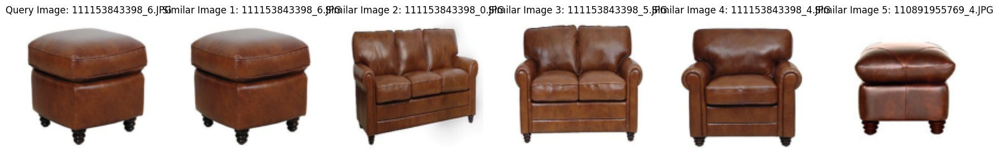

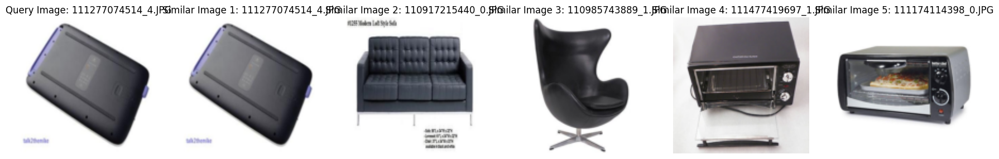

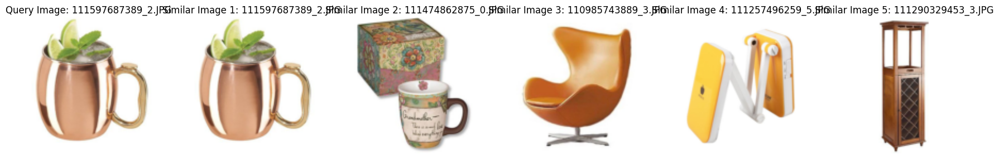

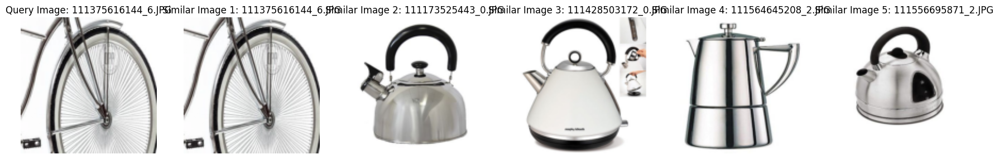

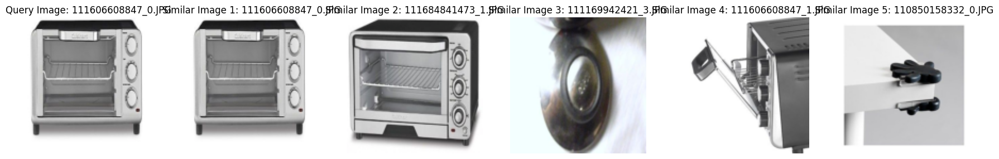

In [91]:
for _ in range(5):
    random_idx = random.randint(0, len(test_dataset) - 1)
    query_img, _, query_path = test_dataset[random_idx]
    query_image = query_img.unsqueeze(0).cuda()
    with torch.no_grad():
        query_features = model(query_image).cpu().numpy()
    indices = find_similar_images(query_features, features, k=5)
    visualize_query_and_results(query_img, query_path, indices, test_dataset, paths)


In [38]:
from online_triplet_loss.losses import batch_all_triplet_loss, batch_hard_triplet_loss
from sklearn.metrics import pairwise_distances

In [41]:
def visualize_triplets(dataloader, model, num_examples=5):
    model.eval()
    with torch.no_grad():
        for batch in dataloader:
            images, labels, paths = batch
            images = images.cuda()
            embeddings = model(images).cpu().numpy()

            triplet_count = 0
            fig, axs = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

            for i in range(len(labels)):
                if triplet_count >= num_examples:
                    break

                anchor_img = denormalize(images[i].cpu()).permute(1, 2, 0).numpy()

                # Find positive example (second closest same-class embedding)
                pos_mask = (labels == labels[i]).numpy()
                pos_distances = pairwise_distances(embeddings[i].reshape(1, -1), embeddings[pos_mask]).flatten()
                pos_distances[pos_distances == 0] = float('inf')  # Exclude the anchor itself
                sorted_pos_indices = pos_distances.argsort()
                second_closest_pos_idx = sorted_pos_indices[1] if len(sorted_pos_indices) > 1 else sorted_pos_indices[0]
                positive_idx = pos_mask.nonzero()[0][second_closest_pos_idx]

                # Find negative example (farthest different-class embedding)
                neg_mask = (labels != labels[i]).numpy()
                neg_distances = pairwise_distances(embeddings[i].reshape(1, -1), embeddings[neg_mask]).flatten()
                negative_idx = neg_mask.nonzero()[0][neg_distances.argmax()]

                positive_img = denormalize(images[positive_idx].cpu()).permute(1, 2, 0).numpy()
                negative_img = denormalize(images[negative_idx].cpu()).permute(1, 2, 0).numpy()

                axs[triplet_count, 0].imshow(anchor_img)
                axs[triplet_count, 0].set_title(f'Anchor: {os.path.basename(paths[i])}')
                axs[triplet_count, 0].axis('off')

                axs[triplet_count, 1].imshow(positive_img)
                axs[triplet_count, 1].set_title(f'Positive: {os.path.basename(paths[positive_idx])}')
                axs[triplet_count, 1].axis('off')

                axs[triplet_count, 2].imshow(negative_img)
                axs[triplet_count, 2].set_title(f'Negative: {os.path.basename(paths[negative_idx])}')
                axs[triplet_count, 2].axis('off')

                triplet_count += 1

            if triplet_count == 0:
                print("No valid triplets found.")
            else:
                plt.show()
            break

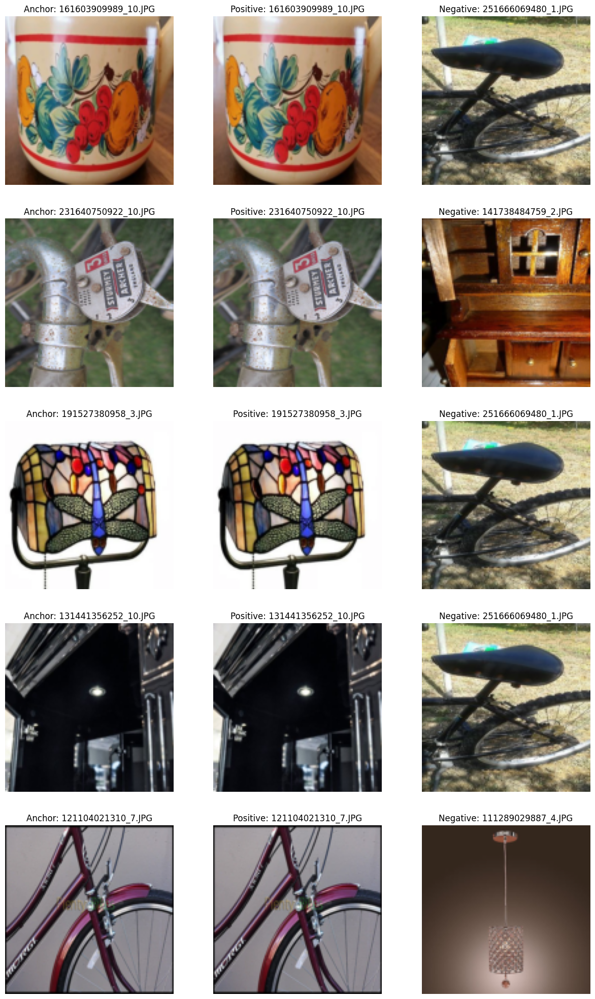

In [42]:
visualize_triplets(dataloader, model)